---
## Scetion 0: Initial setup

**Imports**

In [1]:
# Imports
import sys
from pathlib import Path

# This notebook only orchestrates. Every function and class it calls lives in the
# `macrocircuits` package under src/ -- read or edit it there.
SRC = str(Path.cwd().parent / 'src')
if SRC not in sys.path:
    sys.path.insert(0, SRC)

import matplotlib.pyplot as plt

# Importing macrocircuits also registers the `swim` and `swim_12_links` tasks with
# the dm_control swimmer suite, which is what lets suite.load() find them below.
from macrocircuits import ensure_tonic

# Clone neuromatch/tonic next to this notebook (once) and put it on the import path.
# It has to run before the tonic-backed imports below (training, models); see
# src/macrocircuits/tonic_setup.py for why tonic isn't a pip install.
ensure_tonic()

# The Swim task rewards swimming forward at _SWIM_SPEED and hides the target the
# stock dm_control swimmer chases.
from macrocircuits.training import play_model, train  # See src/macrocircuits/training.py.
from macrocircuits.plotting import (  # See src/macrocircuits/plotting.py.
    plot_performance,
)

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
Users of this version of Gym should be able to simply replace 'import gym' with 'import gymnasium as gym' in the vast majority of cases.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


---
## Section 1: Select parameters

**Parameters**
- Networks used
- Length of the swimmer
- RL Method used
- ...?

In [2]:
# Parameters

---
## Section 2: Training

#### Obstacle Avoidance

In [ ]:
# Training (new envs.py file)

# MLP
train('import tonic.torch',
      'tonic.torch.agents.PPO(model=ppo_mlp_model(actor_sizes=(256, 256), critic_sizes=(256,256)))',
      'tonic.environments.ControlSuite("swimmer-evasion",task_kwargs=dict(n_obstacles=10))',
      name = 'new_env_mlp_256',
      trainer = 'tonic.Trainer(steps=int(5e5),save_steps=int(1e5))')



# NCAP
print("--------------- \n NCAP Agent Running")
train('import tonic.torch',
      # 'tonic.torch.agents.D4PG(model=d4pg_swimmer_model(n_joints=5,critic_sizes=(128,128)))',
      'tonic.torch.agents.PPO(model=ppo_swimmer_model(n_joints=5,critic_sizes=(256,256), include_turn_control=True, controller="evasion"))',
  'tonic.environments.ControlSuite("swimmer-evasion",time_feature=True,task_kwargs=dict(n_obstacles=10))',
  name = 'new_env_ncap_ppo',
  trainer = 'tonic.Trainer(steps=int(1e5),save_steps=int(5e4))')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


Config file saved to data/local/experiments/tonic/swimmer-evasion/new_env_mlp_256/config.yaml
          Time left:  epoch 0:00:00  total 0:27:35          
actor                                                       
  clip fraction                                        0.139
  entropy                                               1.04
  iterations                                              42
  kl                                                  0.0108
  loss                                               -0.0155
  std                                                  0.686
  stop                                                0.0119
critic                                                      
  iterations                                              80
  loss                                                    43
  v                                                    -17.3
test                                                        
  action                                            

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


Config file saved to data/local/experiments/tonic/swimmer-evasion/new_env_pjo_ncap_ppo/config.yaml
          Time left:  epoch 0:00:00  total 0:05:38          
actor                                                       
  clip fraction                                        0.042
  entropy                                             -0.884
  iterations                                              80
  kl                                                  0.0047
  loss                                              -0.00372
  std                                                    0.1
  stop                                                     0
critic                                                      
  iterations                                              80
  loss                                                  38.4
  v                                                    -20.6
test                                                        
  action                                       

#### Foraging

In [2]:
# Training (new envs.py file)

# MLP
train('import tonic.torch',
      'tonic.torch.agents.PPO(model=ppo_mlp_model(actor_sizes=(256, 256), critic_sizes=(256,256)))',
      'tonic.environments.ControlSuite("swimmer-foraging")',
      name = 'mlp_256',
      trainer = 'tonic.Trainer(steps=int(5e5),save_steps=int(1e5))')

# NCAP
print("--------------- \n NCAP Agent Running")
train('import tonic.torch',
      # 'tonic.torch.agents.D4PG(model=d4pg_swimmer_model(n_joints=5,critic_sizes=(128,128)))',
      'tonic.torch.agents.PPO(model=ppo_swimmer_model(n_joints=5,critic_sizes=(256,256), include_turn_control=True, controller="foraging"))',
  'tonic.environments.ControlSuite("swimmer-foraging",time_feature=True)',
  name = 'ncap_ppo (mlp-controller)',
  trainer = 'tonic.Trainer(steps=int(1e5),save_steps=int(5e4))')

# NCAP
print("--------------- \n NCAP Agent Running")
train('import tonic.torch',
      # 'tonic.torch.agents.D4PG(model=d4pg_swimmer_model(n_joints=5,critic_sizes=(128,128)))',
      'tonic.torch.agents.PPO(model=ppo_swimmer_model(n_joints=5,critic_sizes=(256,256), include_turn_control=True, controller="forage_reflex"))',
  'tonic.environments.ControlSuite("swimmer-foraging",time_feature=True)',
  name = 'ncap_ppo (sonja_forage_reflex-controller)',
  trainer = 'tonic.Trainer(steps=int(1e5),save_steps=int(5e4))')


# NCAP - No Controller
print("--------------- \n NCAP Agent Running")
train('import tonic.torch',
      # 'tonic.torch.agents.D4PG(model=d4pg_swimmer_model(n_joints=5,critic_sizes=(128,128)))',
      'tonic.torch.agents.PPO(model=ppo_swimmer_model(n_joints=5,critic_sizes=(256,256), include_turn_control=False, controller=None))',
  'tonic.environments.ControlSuite("swimmer-foraging",time_feature=True)',
  name = 'ncap_ppo (no-controller)',
  trainer = 'tonic.Trainer(steps=int(1e5),save_steps=int(5e4))')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


Config file saved to data/local/experiments/tonic/swimmer-foraging/mlp_256/config.yaml
          Time left:  epoch 0:00:00  total 0:09:16          
actor                                                       
  clip fraction                                        0.108
  entropy                                               1.05
  iterations                                             3.5
  kl                                                  0.0108
  loss                                               -0.0029
  std                                                  0.693
  stop                                                 0.286
critic                                                      
  iterations                                              80
  loss                                                 0.362
  v                                                     2.12
test                                                        
  action                                                   

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


Config file saved to data/local/experiments/tonic/swimmer-foraging/ncap_ppo (mlp-controller)/config.yaml
          Time left:  epoch 0:00:00  total 0:03:08          
actor                                                       
  clip fraction                                       0.0462
  entropy                                             -0.884
  iterations                                              80
  kl                                                 0.00348
  loss                                              -0.00394
  std                                                    0.1
  stop                                                     0
critic                                                      
  iterations                                              80
  loss                                                  2.18
  v                                                     1.69
test                                                        
  action                                 

#### Speed Swim

In [ ]:
# # Training

# # MLP
# train('import tonic.torch',
#       'tonic.torch.agents.PPO(model=ppo_mlp_model(actor_sizes=(256, 256), critic_sizes=(256,256)))',
#       'tonic.environments.ControlSuite("swimmer-swim")',
#       name = 'mlp_256',
#       trainer = 'tonic.Trainer(steps=int(5e5),save_steps=int(1e5))')


# # NCAP
# print("--------------- \n NCAP Agent Running")
# train('import tonic.torch',
#       # 'tonic.torch.agents.D4PG(model=d4pg_swimmer_model(n_joints=5,critic_sizes=(128,128)))',
#       'tonic.torch.agents.PPO(model=ppo_swimmer_model(n_joints=5,critic_sizes=(256,256)))',
#   'tonic.environments.ControlSuite("swimmer-swim",time_feature=True)',
#   name = 'ncap_ppo',
#   trainer = 'tonic.Trainer(steps=int(1e5),save_steps=int(5e4))')

#### Swim To Ball

In [ ]:
# Training (original envs.py file)

# MLP
train('import tonic.torch',
      'tonic.torch.agents.PPO(model=ppo_mlp_model(actor_sizes=(256, 256), critic_sizes=(256,256)))',
      'tonic.environments.ControlSuite("swimmer-swim_to_ball")',
      name = 'mlp_256(swim_to_ball)',
      trainer = 'tonic.Trainer(steps=int(5e5),save_steps=int(1e5))')


# NCAP
print("--------------- \n NCAP Agent Running")
train('import tonic.torch',
      # 'tonic.torch.agents.D4PG(model=d4pg_swimmer_model(n_joints=5,critic_sizes=(128,128)))',
      'tonic.torch.agents.PPO(model=ppo_swimmer_model(n_joints=5,critic_sizes=(256,256)))',
  'tonic.environments.ControlSuite("swimmer-swim_to_ball",time_feature=True)',
  name = 'ncap_ppo(swim_to_ball)',
  trainer = 'tonic.Trainer(steps=int(1e5),save_steps=int(5e4))')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


Config file saved to data/local/experiments/tonic/swimmer-swim_to_ball/mlp_256(swim_to_ball)/config.yaml
          Time left:  epoch 0:00:00  total 0:13:06          
actor                                                       
  clip fraction                                        0.103
  entropy                                               1.05
  iterations                                            24.2
  kl                                                 0.00715
  loss                                               -0.0125
  std                                                   0.69
  stop                                                0.0309
critic                                                      
  iterations                                              80
  loss                                                  37.9
  v                                                     13.8
test                                                        
  action                                 

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


Config file saved to data/local/experiments/tonic/swimmer-swim_to_ball/pjo_ncap_ppo(swim_to_ball)/config.yaml
          Time left:  epoch 0:00:00  total 0:02:56          
actor                                                       
  clip fraction                                       0.0135
  entropy                                             -0.884
  iterations                                              80
  kl                                                 0.00357
  loss                                                -0.001
  std                                                    0.1
  stop                                                     0
critic                                                      
  iterations                                              80
  loss                                                  89.2
  v                                                     33.8
test                                                        
  action                            

---
## Scetion 3: Visualization

**Visualization of the rewards and the behaviour**

In [11]:
# Visualization

## Speed Up Reward

### New Environment

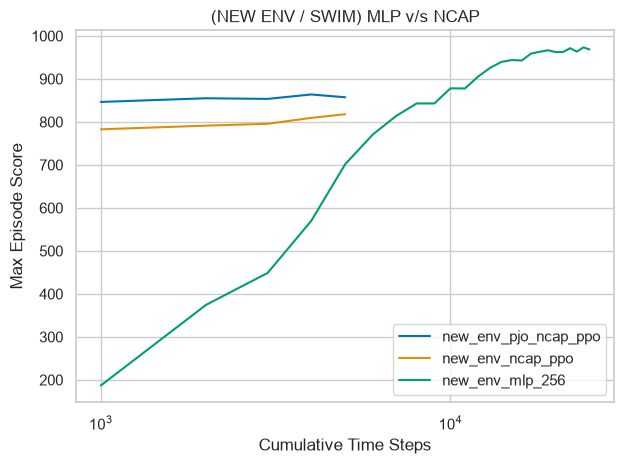

In [ ]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-swim/new_env_ncap_ppo',
    'data/local/experiments/tonic/swimmer-swim/new_env_mlp_256'
]
plot_performance(paths, ax=ax, title='(NEW ENV / SWIM) MLP v/s NCAP')
plt.tight_layout()
plt.show()

### Old Environment

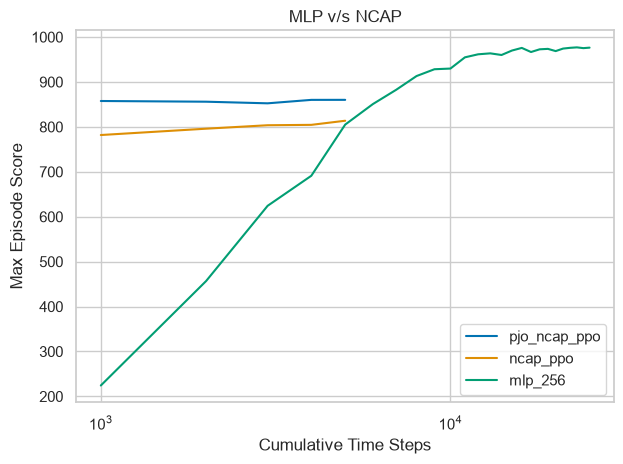

In [ ]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-swim/ncap_ppo',
    'data/local/experiments/tonic/swimmer-swim/mlp_256'
]
plot_performance(paths, ax=ax, title='MLP v/s NCAP')
plt.tight_layout()
plt.show()

In [ ]:
play_model('data/local/experiments/tonic/swimmer-swim/mlp_256')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-swim/mlp_256/checkpoints/step_500000.pt
Reward for the run:  987.0237


In [ ]:
play_model('data/local/experiments/tonic/swimmer-swim/ncap_ppo')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-swim/ncap_ppo/checkpoints/step_100000.pt
Reward for the run:  821.2766


## Speed-Up + Swim To Ball

### New Environment

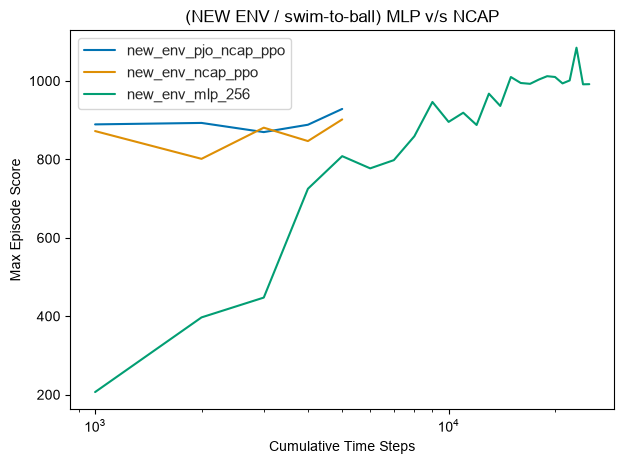

In [3]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-swim_to_ball/new_env_pjo_ncap_ppo',
    'data/local/experiments/tonic/swimmer-swim_to_ball/new_env_ncap_ppo',
    'data/local/experiments/tonic/swimmer-swim_to_ball/new_env_mlp_256'
]
plot_performance(paths, ax=ax, title='(NEW ENV / swim-to-ball) MLP v/s NCAP')
plt.tight_layout()
plt.show()

### Old Environment

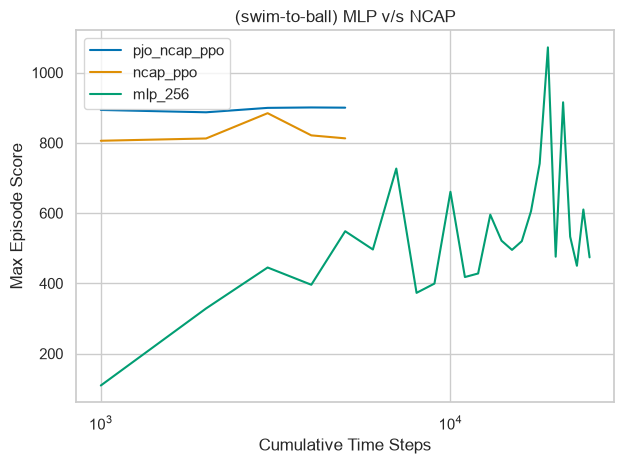

In [4]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-swim_to_ball/pjo_ncap_ppo',
    'data/local/experiments/tonic/swimmer-swim_to_ball/ncap_ppo',
    'data/local/experiments/tonic/swimmer-swim_to_ball/mlp_256'
]
plot_performance(paths, ax=ax, title='(swim-to-ball) MLP v/s NCAP')
plt.tight_layout()
plt.show()

## Foraging

#### Controller

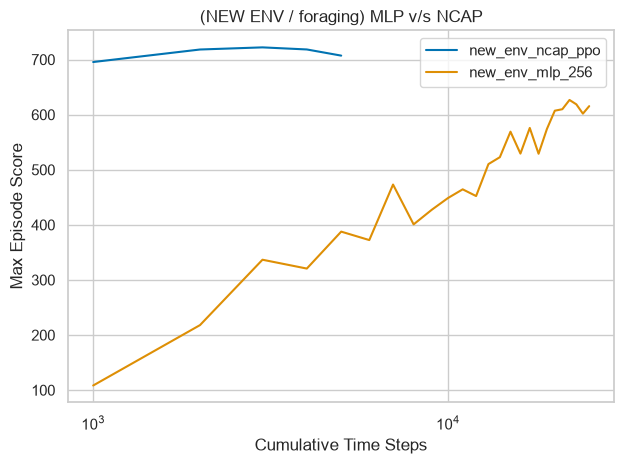

In [4]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-foraging/new_env_ncap_ppo',
    'data/local/experiments/tonic/swimmer-foraging/new_env_mlp_256'
]
plot_performance(paths, ax=ax, title='(NEW ENV / foraging) MLP v/s NCAP')
plt.tight_layout()
plt.show()

In [4]:
play_model('data/local/experiments/tonic/swimmer-foraging/new_env_mlp_256')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-foraging/new_env_mlp_256/checkpoints/step_500000.pt
Reward for the run:  603.0209


In [5]:
play_model('data/local/experiments/tonic/swimmer-foraging/new_env_ncap_ppo')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-foraging/new_env_ncap_ppo/checkpoints/step_100000.pt
Reward for the run:  687.77704


#### No-Controller

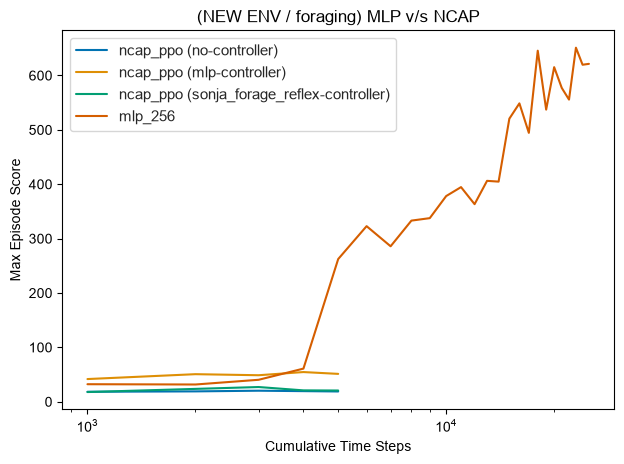

In [2]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-foraging/ncap_ppo (no-controller)',
    'data/local/experiments/tonic/swimmer-foraging/ncap_ppo (mlp-controller)',
    'data/local/experiments/tonic/swimmer-foraging/ncap_ppo (sonja_forage_reflex-controller)',
    'data/local/experiments/tonic/swimmer-foraging/mlp_256'
]
plot_performance(paths, ax=ax, title='(NEW ENV / foraging) MLP v/s NCAP')
plt.tight_layout()
plt.show()

In [3]:
play_model('data/local/experiments/tonic/swimmer-foraging/mlp_256')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-foraging/mlp_256/checkpoints/step_500000.pt
Reward for the run:  665.60223


In [4]:
play_model('data/local/experiments/tonic/swimmer-foraging/ncap_ppo (no-controller)')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-foraging/ncap_ppo (no-controller)/checkpoints/step_100000.pt
Reward for the run:  22.8877


In [5]:
play_model('data/local/experiments/tonic/swimmer-foraging/ncap_ppo (mlp-controller)')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-foraging/ncap_ppo (mlp-controller)/checkpoints/step_100000.pt
Reward for the run:  35.276184


In [3]:
play_model('data/local/experiments/tonic/swimmer-foraging/ncap_ppo (sonja_forage_reflex-controller)')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-foraging/ncap_ppo (sonja_forage_reflex-controller)/checkpoints/step_100000.pt
Reward for the run:  15.289846


## Obstacle Avoidance

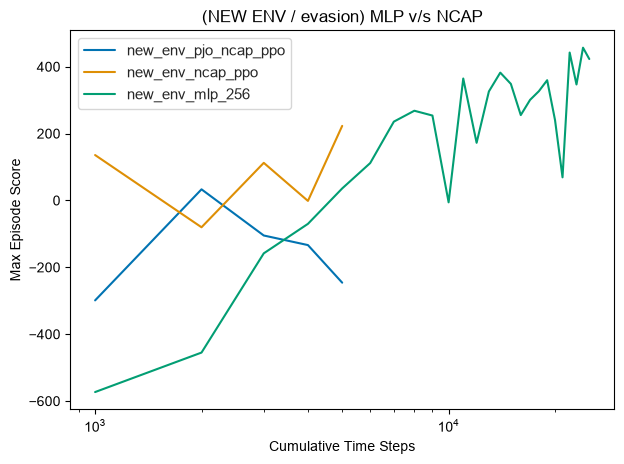

In [ ]:
# rerun this cell if it displays moret than the graphs
%matplotlib inline
fig, ax = plt.subplots()

#Replace the paths with the path to models you trained to plot their performance.
paths = [
    'data/local/experiments/tonic/swimmer-evasion/new_env_ncap_ppo',
    'data/local/experiments/tonic/swimmer-evasion/new_env_mlp_256'
]
plot_performance(paths, ax=ax, title='(NEW ENV / evasion) MLP v/s NCAP')
plt.tight_layout()
plt.show()

In [4]:
play_model('data/local/experiments/tonic/swimmer-evasion/new_env_mlp_256')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-evasion/new_env_mlp_256/checkpoints/step_500000.pt
Reward for the run:  402.44562


In [6]:
play_model('data/local/experiments/tonic/swimmer-evasion/new_env_ncap_ppo')

/home/petron/workshops_conferences_summerschools/Neuromatch_NeuroAI/Projects/neuroai-macrocircuits/.venv/lib/python3.12/site-packages/gym/spaces/box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")



Loading weights from data/local/experiments/tonic/swimmer-evasion/new_env_ncap_ppo/checkpoints/step_100000.pt
Reward for the run:  244.56297
